In [2]:
import json
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pathlib import Path
from collections import Counter, defaultdict
from PIL import Image
import polars as pl

In [3]:
# Set style for better visualizations
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

In [20]:
dataset_path = Path('../barcode_dataset')
splits = ['train', 'val', 'test']
data = {}
for split in splits:
    annotation_file = dataset_path / split / '_annotations.coco.json'
    if annotation_file.exists():
        with open(annotation_file, 'r') as f:
            data[split] = json.load(f)
        print(f"✓ Loaded {split} annotations")
    else:
        print(f"✗ Missing {split} annotations")

✓ Loaded train annotations
✓ Loaded val annotations
✓ Loaded test annotations


In [16]:
data

{'train': {'images': [{'id': 2731,
    'file_name': 'THEA_train_002731.jpg',
    'width': 1024,
    'height': 768},
   {'id': 24981,
    'file_name': 'barcode_finder_train_024981.jpg',
    'width': 640,
    'height': 480},
   {'id': 20752,
    'file_name': 'barcodes_mironet_val_020752.jpg',
    'width': 2048,
    'height': 1536},
   {'id': 1649,
    'file_name': 'THEA_train_001649.jpg',
    'width': 480,
    'height': 480},
   {'id': 24416,
    'file_name': 'barcode_finder_train_024416.jpg',
    'width': 640,
    'height': 480},
   {'id': 7507,
    'file_name': 'THEA_val_007507.jpg',
    'width': 648,
    'height': 488},
   {'id': 11171,
    'file_name': 'barcode_train_011171.jpg',
    'width': 640,
    'height': 480},
   {'id': 24870,
    'file_name': 'barcode_finder_train_024870.jpg',
    'width': 648,
    'height': 488},
   {'id': 2846,
    'file_name': 'THEA_train_002846.jpg',
    'width': 480,
    'height': 480},
   {'id': 24968,
    'file_name': 'barcode_finder_train_024968.jpg',

### Analyze number of images and annotations in each split

In [7]:
results = {}

for split in splits:
    num_images = data[split]['images']
    num_annotations = data[split]['annotations']

    results[split] = {
        'num_images': len(num_images),
        'num_annotations': len(num_annotations),
        'avg_barcodes_per_image': len(num_annotations) / len(num_images) if len(num_images) > 0 else 0
    }

    print(f"\n{split.upper()}:")
    print(f"  Images: {results[split]['num_images']:,}")
    print(f"  Annotations: {results[split]['num_annotations']:,}")
    print(f"  Avg annotations/image: {results[split]['avg_barcodes_per_image']:.2f}")

# Print total
total_images = sum(r['num_images'] for r in results.values())
total_annotations = sum(r['num_annotations'] for r in results.values())
print(f"\nTOTAL:")
print(f"  Images: {total_images:,}")
print(f"  Annotations: {total_annotations:,}")



TRAIN:
  Images: 13,087
  Annotations: 28,727
  Avg annotations/image: 2.20

VAL:
  Images: 2,804
  Annotations: 6,122
  Avg annotations/image: 2.18

TEST:
  Images: 2,806
  Annotations: 6,093
  Avg annotations/image: 2.17

TOTAL:
  Images: 18,697
  Annotations: 40,942


## 2. Barcodes per Image Distribution


TRAIN:
  Min barcodes/image: 0
  Max barcodes/image: 32
  Mean barcodes/image: 2.20
  Median barcodes/image: 1.00
  Images with 0 barcodes: 7 (0.1%)
  Images with 1 barcode: 7916 (60.5%)
  Images with 2+ barcodes: 5164 (39.5%)

VAL:
  Min barcodes/image: 0
  Max barcodes/image: 26
  Mean barcodes/image: 2.18
  Median barcodes/image: 1.00
  Images with 0 barcodes: 4 (0.1%)
  Images with 1 barcode: 1740 (62.1%)
  Images with 2+ barcodes: 1060 (37.8%)

TEST:
  Min barcodes/image: 0
  Max barcodes/image: 23
  Mean barcodes/image: 2.17
  Median barcodes/image: 1.00
  Images with 0 barcodes: 4 (0.1%)
  Images with 1 barcode: 1715 (61.1%)
  Images with 2+ barcodes: 1087 (38.7%)


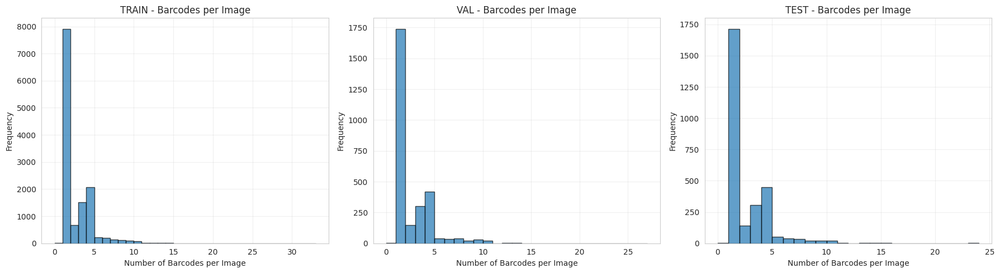

In [9]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, split in enumerate(splits):
    if split not in data:
        continue

    # Count annotations per image
    image_annotation_count = defaultdict(int)
    for ann in data[split]['annotations']:
        image_annotation_count[ann['image_id']] += 1

    # Include images with 0 annotations
    all_image_ids = {img['id'] for img in data[split]['images']}
    for img_id in all_image_ids:
        if img_id not in image_annotation_count:
            image_annotation_count[img_id] = 0

    counts = list(image_annotation_count.values())
    counter = Counter(counts)

    # Print statistics
    print(f"\n{split.upper()}:")
    print(f"  Min barcodes/image: {min(counts)}")
    print(f"  Max barcodes/image: {max(counts)}")
    print(f"  Mean barcodes/image: {np.mean(counts):.2f}")
    print(f"  Median barcodes/image: {np.median(counts):.2f}")
    print(f"  Images with 0 barcodes: {counter[0]} ({counter[0]/len(counts)*100:.1f}%)")
    print(f"  Images with 1 barcode: {counter[1]} ({counter[1]/len(counts)*100:.1f}%)")
    print(f"  Images with 2+ barcodes: {sum(v for k,v in counter.items() if k >= 2)} ({sum(v for k,v in counter.items() if k >= 2)/len(counts)*100:.1f}%)")

    # Plot histogram
    axes[idx].hist(counts, bins=range(0, max(counts)+2), edgecolor='black', alpha=0.7)
    axes[idx].set_xlabel('Number of Barcodes per Image')
    axes[idx].set_ylabel('Frequency')

    axes[idx].set_title(f'{split.upper()} - Barcodes per Image')

    axes[idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


## 3. Image Dimensions


TRAIN:
  Width range: 416 - 4032 px
  Height range: 416 - 4032 px
  Mean dimensions: 944 x 857 px
  Aspect ratio range: 0.56 - 1.33
  Mean aspect ratio: 1.13
  Unique image dimensions: 583
  Top 3 dimensions:
    480x480: 3845 images (29.4%)
    640x480: 3009 images (23.0%)
    640x640: 938 images (7.2%)

VAL:
  Width range: 416 - 4032 px
  Height range: 416 - 4032 px
  Mean dimensions: 949 x 865 px
  Aspect ratio range: 0.56 - 1.33
  Mean aspect ratio: 1.13
  Unique image dimensions: 159
  Top 3 dimensions:
    480x480: 773 images (27.6%)
    640x480: 654 images (23.3%)
    640x640: 219 images (7.8%)

TEST:
  Width range: 416 - 4032 px
  Height range: 416 - 4032 px
  Mean dimensions: 955 x 864 px
  Aspect ratio range: 0.56 - 1.33
  Mean aspect ratio: 1.13
  Unique image dimensions: 171
  Top 3 dimensions:
    480x480: 782 images (27.9%)
    640x480: 631 images (22.5%)
    640x640: 189 images (6.7%)


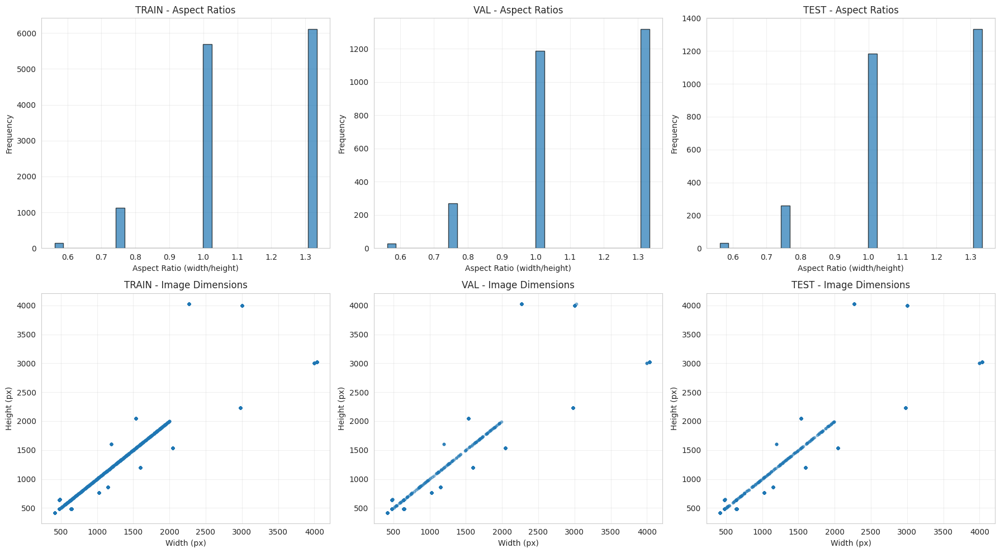

In [11]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for idx, split in enumerate(splits):
    if split not in data:
        continue

    widths = [img['width'] for img in data[split]['images']]
    heights = [img['height'] for img in data[split]['images']]
    aspect_ratios = [w/h for w, h in zip(widths, heights)]
    resolutions = [w*h for w, h in zip(widths, heights)]

    print(f"\n{split.upper()}:")
    print(f"  Width range: {min(widths)} - {max(widths)} px")
    print(f"  Height range: {min(heights)} - {max(heights)} px")
    print(f"  Mean dimensions: {np.mean(widths):.0f} x {np.mean(heights):.0f} px")
    print(f"  Aspect ratio range: {min(aspect_ratios):.2f} - {max(aspect_ratios):.2f}")
    print(f"  Mean aspect ratio: {np.mean(aspect_ratios):.2f}")

    # Count unique dimensions
    unique_dims = set(zip(widths, heights))
    print(f"  Unique image dimensions: {len(unique_dims)}")

    # Most common dimensions
    dim_counter = Counter(zip(widths, heights))
    print(f"  Top 3 dimensions:")
    for (w, h), count in dim_counter.most_common(3):
        print(f"    {w}x{h}: {count} images ({count/len(widths)*100:.1f}%)")

    # Plot aspect ratio distribution
    axes[0, idx].hist(aspect_ratios, bins=30, edgecolor='black', alpha=0.7)
    axes[0, idx].set_xlabel('Aspect Ratio (width/height)')
    axes[0, idx].set_ylabel('Frequency')
    axes[0, idx].set_title(f'{split.upper()} - Aspect Ratios')
    axes[0, idx].grid(True, alpha=0.3)

    # Plot resolution scatter
    axes[1, idx].scatter(widths, heights, alpha=0.5, s=10)
    axes[1, idx].set_xlabel('Width (px)')
    axes[1, idx].set_ylabel('Height (px)')
    axes[1, idx].set_title(f'{split.upper()} - Image Dimensions')
    axes[1, idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 4. Bounding Boxes


TRAIN:
  BBox width range: 0.2 - 2675.9 px
  BBox height range: 0.0 - 2170.3 px
  Mean BBox size: 261.1 x 218.8 px
  BBox aspect ratio range: 0.00 - 24.97
  Mean BBox aspect ratio: 1.44
  Relative area range: 0.00% - 92.26%
  Mean relative area: 8.67% of image
  Small bboxes (<1% of image): 3066 (10.7%)

VAL:
  BBox width range: 0.5 - 2127.0 px
  BBox height range: 1.0 - 2170.0 px
  Mean BBox size: 265.4 x 220.8 px
  BBox aspect ratio range: 0.06 - 21.30
  Mean BBox aspect ratio: 1.46
  Relative area range: 0.00% - 70.79%
  Mean relative area: 8.59% of image
  Small bboxes (<1% of image): 765 (12.5%)

TEST:
  BBox width range: 13.0 - 2533.8 px
  BBox height range: 14.0 - 1685.0 px
  Mean BBox size: 265.3 x 219.9 px
  BBox aspect ratio range: 0.07 - 16.79
  Mean BBox aspect ratio: 1.44
  Relative area range: 0.06% - 92.74%
  Mean relative area: 8.66% of image
  Small bboxes (<1% of image): 629 (10.3%)


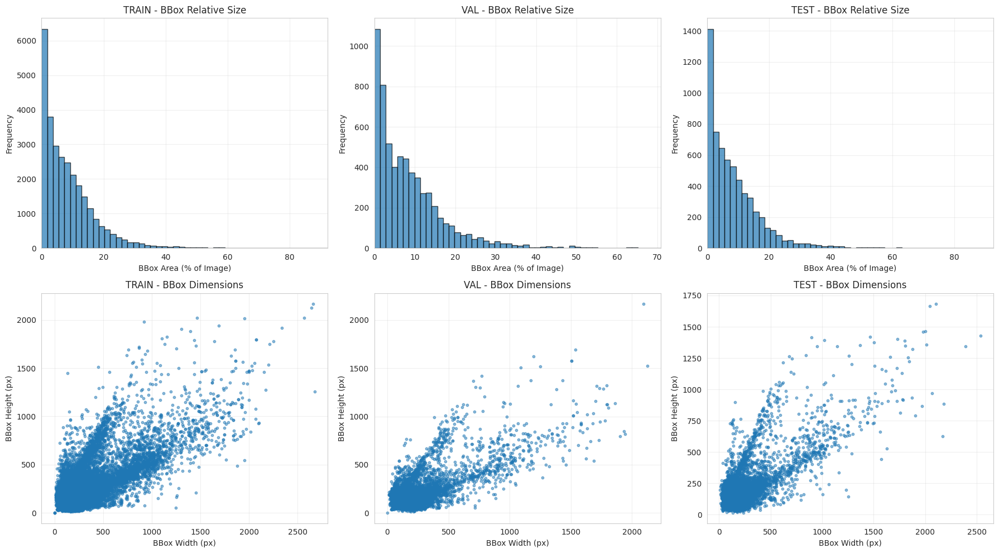

In [12]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for idx, split in enumerate(splits):
    if split not in data:
        continue

    # Create image_id to dimensions mapping
    img_dims = {img['id']: (img['width'], img['height'])
                for img in data[split]['images']}

    bbox_widths = []
    bbox_heights = []
    bbox_areas = []
    relative_areas = []  # bbox area / image area
    aspect_ratios = []

    for ann in data[split]['annotations']:
        # COCO format: [x, y, width, height]
        x, y, w, h = ann['bbox']
        bbox_widths.append(w)
        bbox_heights.append(h)
        bbox_areas.append(w * h)
        aspect_ratios.append(w / h if h > 0 else 0)

        # Calculate relative area
        img_w, img_h = img_dims[ann['image_id']]
        img_area = img_w * img_h
        relative_areas.append((w * h) / img_area if img_area > 0 else 0)

    print(f"\n{split.upper()}:")
    print(f"  BBox width range: {min(bbox_widths):.1f} - {max(bbox_widths):.1f} px")
    print(f"  BBox height range: {min(bbox_heights):.1f} - {max(bbox_heights):.1f} px")
    print(f"  Mean BBox size: {np.mean(bbox_widths):.1f} x {np.mean(bbox_heights):.1f} px")
    print(f"  BBox aspect ratio range: {min(aspect_ratios):.2f} - {max(aspect_ratios):.2f}")
    print(f"  Mean BBox aspect ratio: {np.mean(aspect_ratios):.2f}")
    print(f"  Relative area range: {min(relative_areas)*100:.2f}% - {max(relative_areas)*100:.2f}%")
    print(f"  Mean relative area: {np.mean(relative_areas)*100:.2f}% of image")

    # Identify small bboxes (< 1% of image)
    small_bboxes = sum(1 for area in relative_areas if area < 0.01)
    print(f"  Small bboxes (<1% of image): {small_bboxes} ({small_bboxes/len(relative_areas)*100:.1f}%)")

    # Plot relative area distribution
    axes[0, idx].hist(np.array(relative_areas) * 100, bins=50, edgecolor='black', alpha=0.7)
    axes[0, idx].set_xlabel('BBox Area (% of Image)')
    axes[0, idx].set_ylabel('Frequency')
    axes[0, idx].set_title(f'{split.upper()} - BBox Relative Size')
    axes[0, idx].set_xlim(0, max(relative_areas)*100)
    axes[0, idx].grid(True, alpha=0.3)

    # Plot bbox dimensions scatter
    axes[1, idx].scatter(bbox_widths, bbox_heights, alpha=0.5, s=10)
    axes[1, idx].set_xlabel('BBox Width (px)')
    axes[1, idx].set_ylabel('BBox Height (px)')
    axes[1, idx].set_title(f'{split.upper()} - BBox Dimensions')
    axes[1, idx].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## Class imbalance

In [18]:
for split in splits:
    if split not in data:
        continue

    # Get category information
    categories = {cat['id']: cat['name'] for cat in data[split]['categories']}

    # Count annotations per category
    category_counts = Counter(ann['category_id'] for ann in data[split]['annotations'])

    print(f"\n{split.upper()}:")
    print(f"  Number of classes: {len(categories)}")
    print(f"  Classes: {list(categories.values())}")

    for cat_id, cat_name in categories.items():
        count = category_counts[cat_id]
        percentage = count / len(data[split]['annotations']) * 100
        print(f"    {cat_name}: {count} annotations ({percentage:.1f}%)")

    # Check for class imbalance
    if len(category_counts) > 1:
        min_count = min(category_counts.values())
        max_count = max(category_counts.values())
        imbalance_ratio = max_count / min_count if min_count > 0 else float('inf')
        print(f"  Class imbalance ratio: {imbalance_ratio:.2f}:1")
        if imbalance_ratio > 3:
            print(f"  ⚠️  WARNING: Significant class imbalance detected!")



TRAIN:
  Number of classes: 1
  Classes: ['barcode']
    barcode: 28727 annotations (100.0%)

VAL:
  Number of classes: 1
  Classes: ['barcode']
    barcode: 6122 annotations (100.0%)

TEST:
  Number of classes: 1
  Classes: ['barcode']
    barcode: 6093 annotations (100.0%)


## Edge Cases

In [19]:
for split in splits:
    if split not in data:
        continue

    print(f"\n{split.upper()}:")

    # Create image_id to dimensions mapping
    img_dims = {img['id']: (img['width'], img['height'])
                for img in data[split]['images']}

    # Check for various edge cases
    edge_cases = {
        'very_small_bbox': 0,      # < 10x10 pixels
        'very_large_bbox': 0,      # > 90% of image
        'extreme_aspect_ratio': 0, # aspect ratio > 10 or < 0.1
        'bbox_out_of_bounds': 0,   # bbox extends beyond image
        'zero_area_bbox': 0,       # width or height is 0
    }

    for ann in data[split]['annotations']:
        x, y, w, h = ann['bbox']
        img_w, img_h = img_dims[ann['image_id']]

        # Check for very small bboxes
        if w < 10 or h < 10:
            edge_cases['very_small_bbox'] += 1

        # Check for very large bboxes
        relative_area = (w * h) / (img_w * img_h)
        if relative_area > 0.9:
            edge_cases['very_large_bbox'] += 1

        # Check for extreme aspect ratios
        aspect_ratio = w / h if h > 0 else 0
        if aspect_ratio > 10 or (aspect_ratio < 0.1 and aspect_ratio > 0):
            edge_cases['extreme_aspect_ratio'] += 1

        # Check if bbox extends beyond image boundaries
        if x < 0 or y < 0 or x + w > img_w or y + h > img_h:
            edge_cases['bbox_out_of_bounds'] += 1

        # Check for zero area bboxes
        if w == 0 or h == 0:
            edge_cases['zero_area_bbox'] += 1

    # Print edge case statistics
    total_annotations = len(data[split]['annotations'])
    for case_type, count in edge_cases.items():
        if count > 0:
            percentage = count / total_annotations * 100
            print(f"  {case_type}: {count} ({percentage:.2f}%)")

    # Check for images with no annotations
    image_ids_with_annotations = set(ann['image_id'] for ann in data[split]['annotations'])
    all_image_ids = set(img['id'] for img in data[split]['images'])
    images_without_annotations = len(all_image_ids - image_ids_with_annotations)

    if images_without_annotations > 0:
        percentage = images_without_annotations / len(all_image_ids) * 100
        print(f"  images_without_annotations: {images_without_annotations} ({percentage:.1f}%)")



TRAIN:
  very_small_bbox: 4 (0.01%)
  very_large_bbox: 1 (0.00%)
  extreme_aspect_ratio: 61 (0.21%)
  bbox_out_of_bounds: 338 (1.18%)
  zero_area_bbox: 1 (0.00%)
  images_without_annotations: 7 (0.1%)

VAL:
  very_small_bbox: 1 (0.02%)
  extreme_aspect_ratio: 11 (0.18%)
  bbox_out_of_bounds: 92 (1.50%)
  images_without_annotations: 4 (0.1%)

TEST:
  very_large_bbox: 1 (0.02%)
  extreme_aspect_ratio: 10 (0.16%)
  bbox_out_of_bounds: 63 (1.03%)
  images_without_annotations: 4 (0.1%)


## Example Images for Edge Cases

Images with 0 annotations:


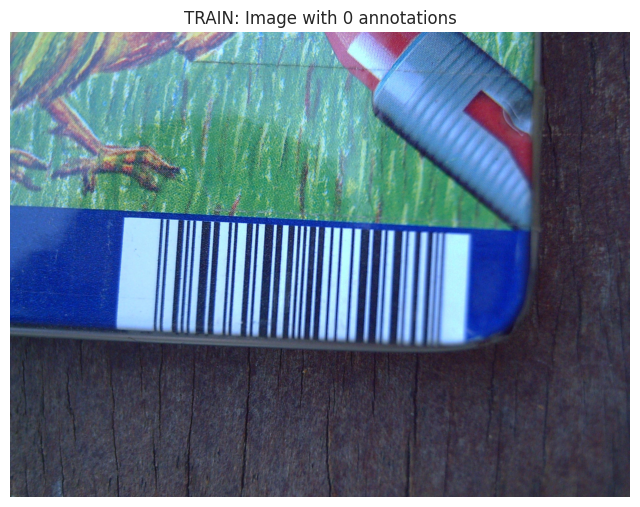

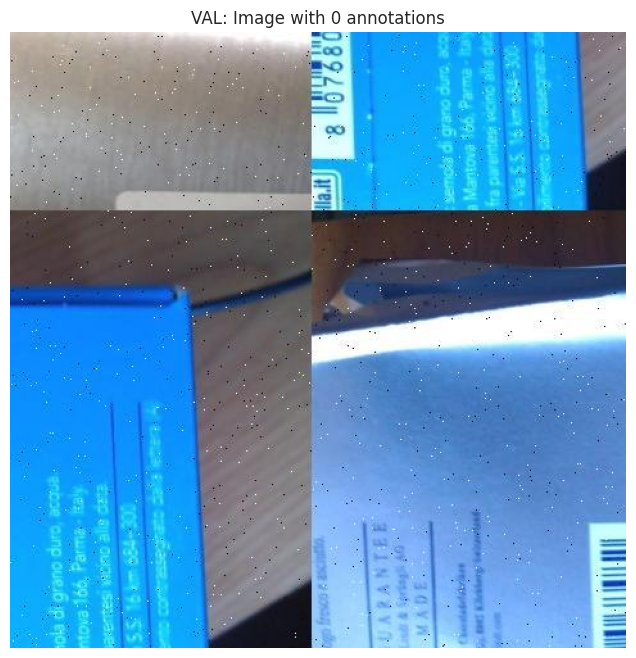

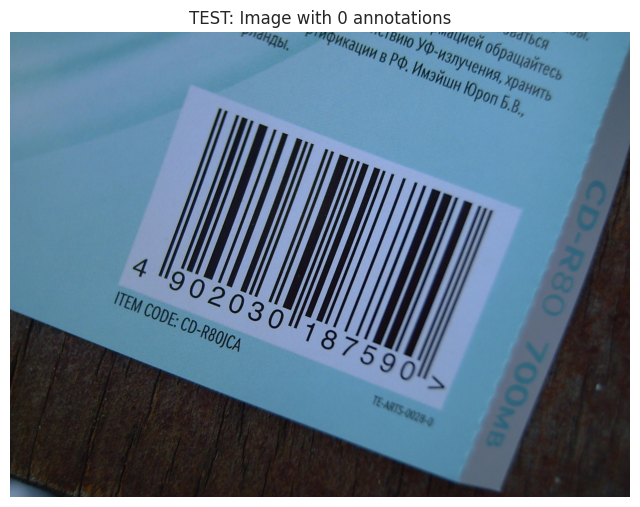


Images with bbox out of bounds:
Image size: 2976 x 2232
BBox: x=314, y=214, w=1953.11, h=2018.08


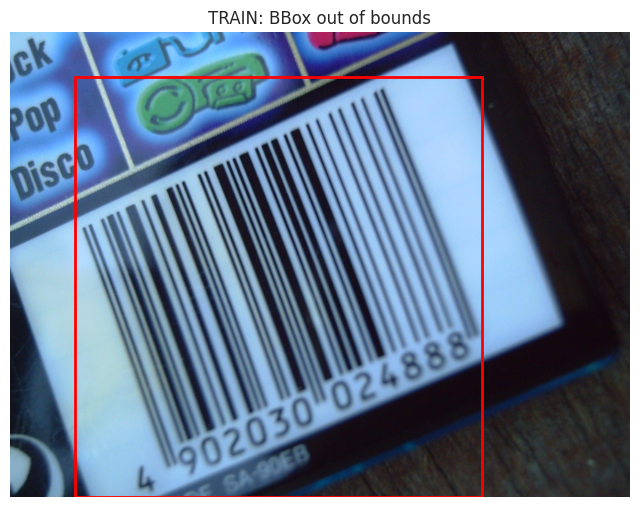

Image size: 640 x 640
BBox: x=212, y=315, w=396.506, h=325.429


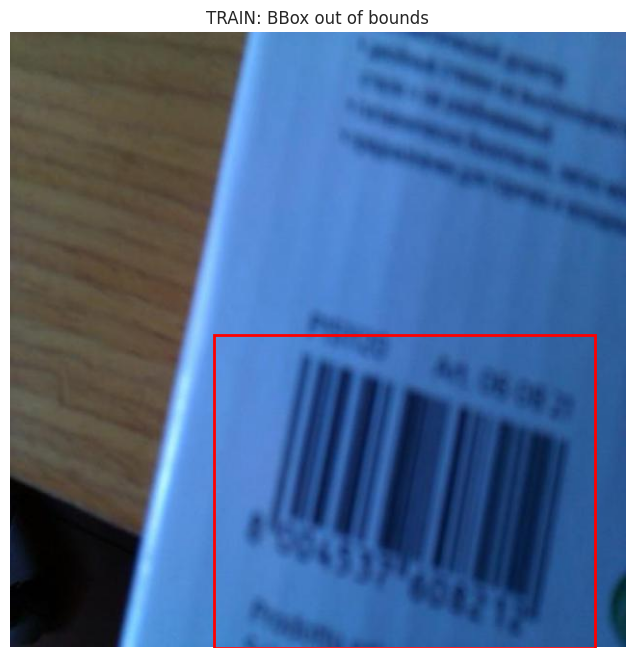

Image size: 640 x 640
BBox: x=75, y=23, w=483.75, h=617.5


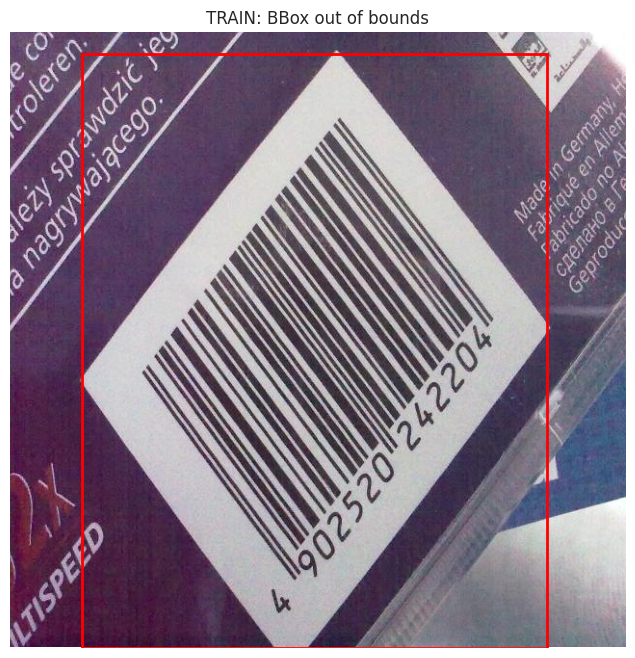

Image size: 640 x 640
BBox: x=105, y=51, w=412.5, h=589.375


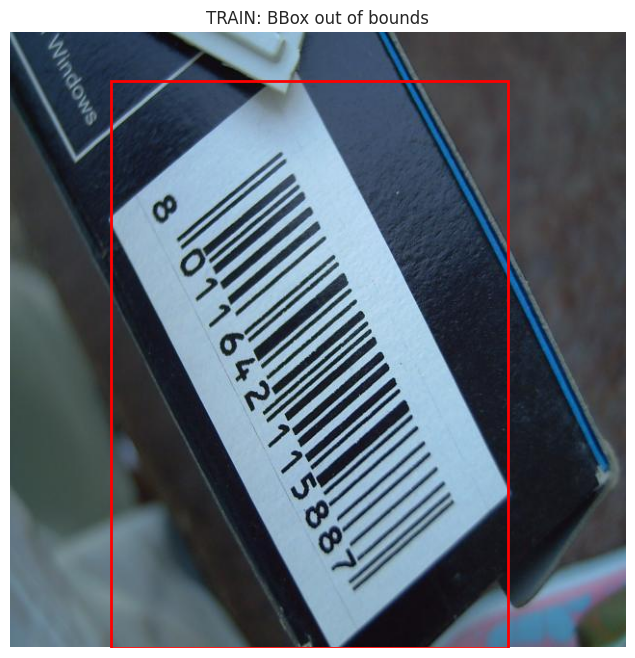

Image size: 640 x 640
BBox: x=47, y=54, w=475.538, h=586.407


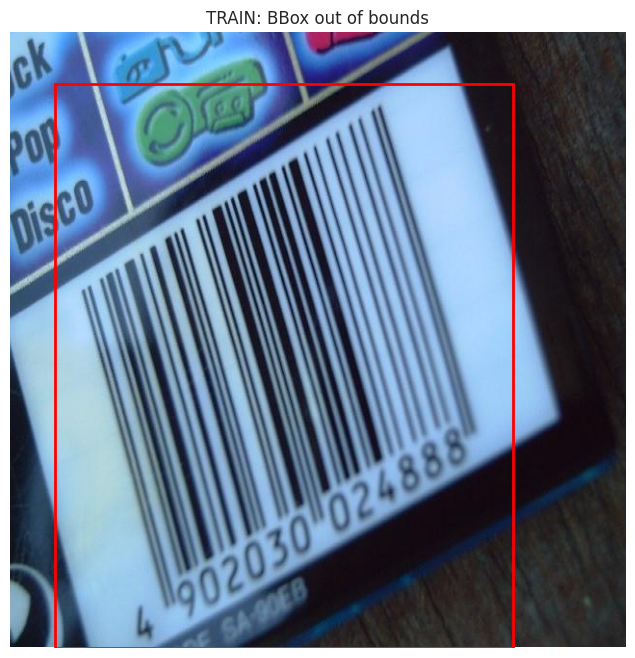

Image size: 640 x 640
BBox: x=24, y=31, w=496.25, h=609.375


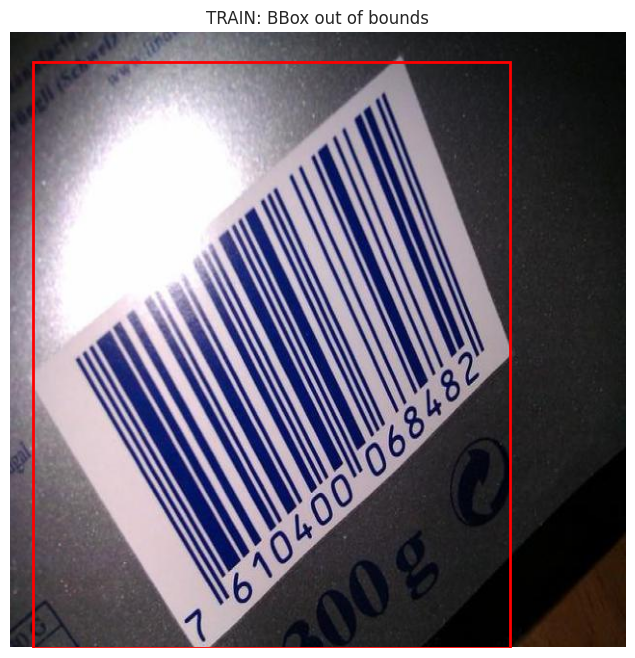

Image size: 640 x 640
BBox: x=309, y=4, w=331.25, h=370


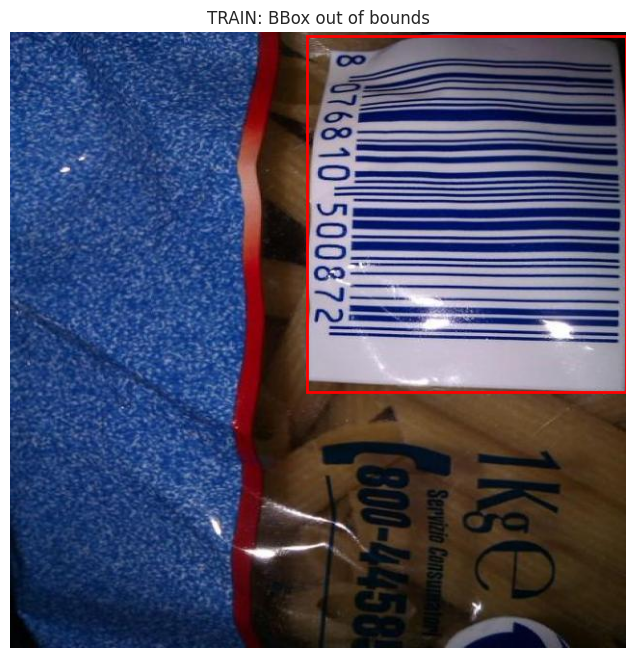

Image size: 640 x 640
BBox: x=105, y=51, w=412.5, h=589.375


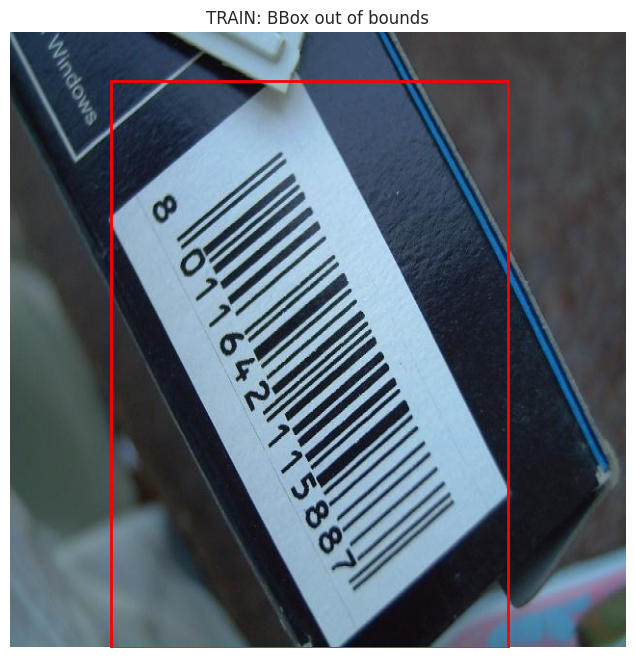

Image size: 1536 x 2048
BBox: x=1358, y=147, w=178.14, h=150


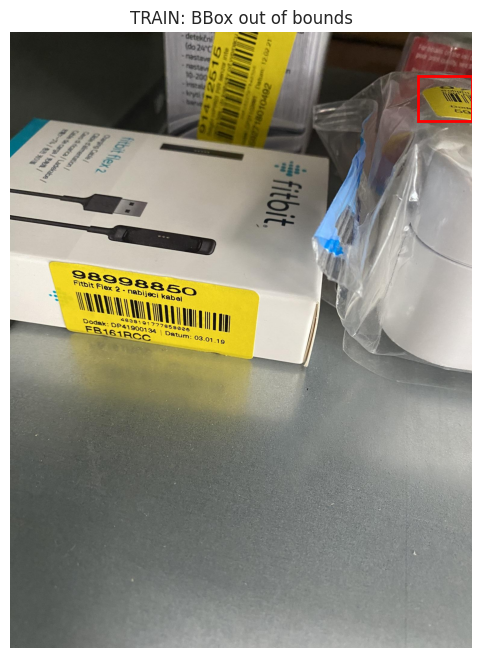

Image size: 1536 x 2048
BBox: x=1258, y=53, w=278.14, h=156.67


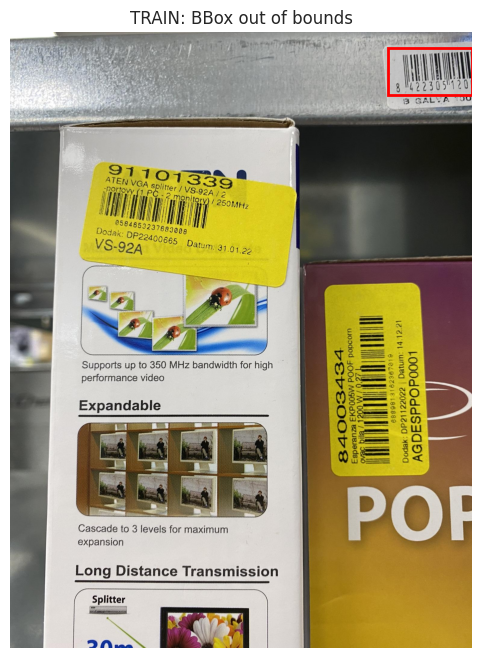


Images with very large bbox (>90% of image):
Image size: 640 x 640
BBox: x=20, y=0, w=597, h=633


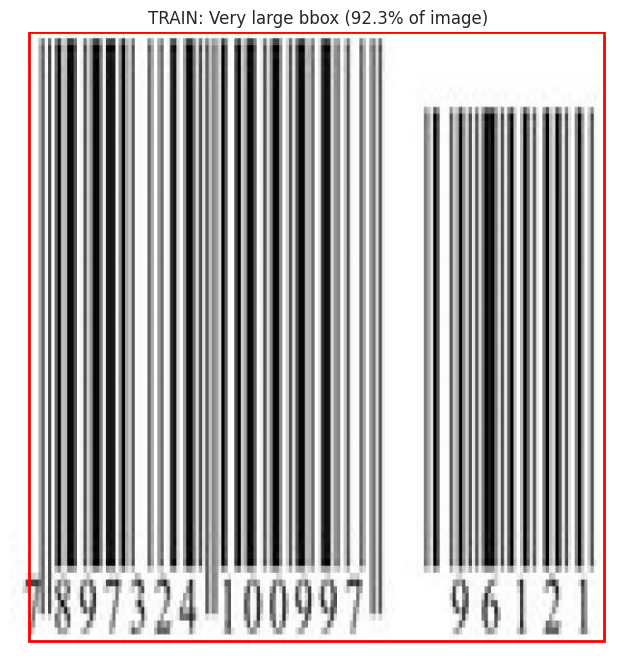


Images with extreme aspect ratio bbox:
Image size: 480 x 480
BBox: x=0, y=29, w=18, h=258


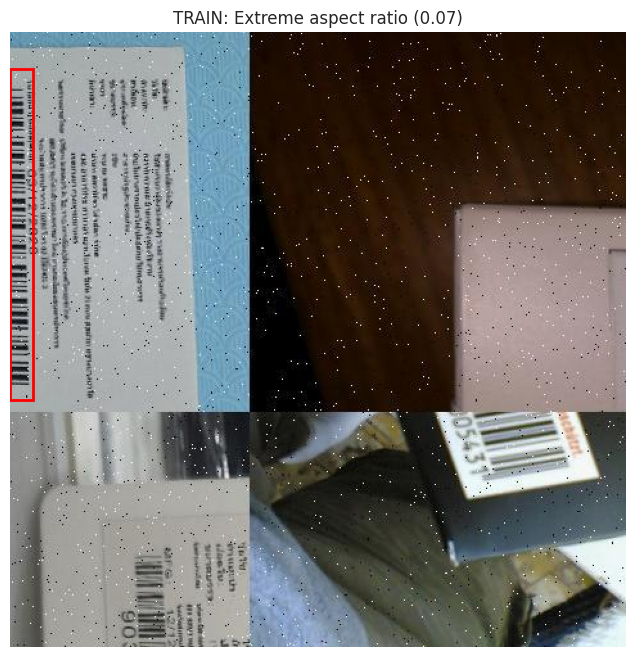

In [31]:
from matplotlib.patches import Rectangle

def display_image_with_bbox(img_path, bbox=None, title=""):
    img = Image.open(img_path)
    fig, ax = plt.subplots(1, figsize=(8, 8))
    ax.imshow(img)
    if bbox:
        x, y, w, h = bbox
        rect = Rectangle((x, y), w, h, linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        # Adjust axes limits to show bbox even if out of bounds
        img_w, img_h = img.size
        ax.set_xlim(min(0, x), max(img_w, x + w))
        ax.set_ylim(max(img_h, y + h), min(0, y))  # Note: y=0 is top in imshow
        # Print coords for verification
        print(f"Image size: {img_w} x {img_h}")
        print(f"BBox: x={x}, y={y}, w={w}, h={h}")
    ax.set_title(title)
    ax.axis('off')
    plt.show()

# Example 1: Images with 0 annotations
print("Images with 0 annotations:")
NUM_BBOX_ZEROANN = 5
count = 0
for split in splits:
    if split not in data:
        continue
    image_ids_with_annotations = set(ann['image_id'] for ann in data[split]['annotations'])
    all_image_ids = set(img['id'] for img in data[split]['images'])
    images_without = all_image_ids - image_ids_with_annotations
    if images_without:
        example_id = next(iter(images_without))
        img_info = next(img for img in data[split]['images'] if img['id'] == example_id)
        img_path = dataset_path / split / img_info['file_name']
        display_image_with_bbox(img_path, title=f"{split.upper()}: Image with 0 annotations")
        count += 1
        if count >= NUM_BBOX_ZEROANN:
            break

# Example 2: BBox out of bounds
print("\nImages with bbox out of bounds:")
NUM_BBOX_OOB = 10
count = 0
for split in splits:
    if split not in data:
        continue
    img_dims = {img['id']: (img['width'], img['height']) for img in data[split]['images']}
    for ann in data[split]['annotations']:
        x, y, w, h = ann['bbox']
        img_w, img_h = img_dims[ann['image_id']]
        if x < 0 or y < 0 or x + w > img_w or y + h > img_h:
            img_info = next(img for img in data[split]['images'] if img['id'] == ann['image_id'])
            img_path = dataset_path / split / img_info['file_name']
            display_image_with_bbox(img_path, bbox=ann['bbox'], title=f"{split.upper()}: BBox out of bounds")
            count += 1
            if count >= NUM_BBOX_OOB:
                break
    else:
        continue
    break  # Show only one example

# Example 3: Very large bbox (>90% of image)
print("\nImages with very large bbox (>90% of image):")
for split in splits:
    if split not in data:
        continue
    img_dims = {img['id']: (img['width'], img['height']) for img in data[split]['images']}
    for ann in data[split]['annotations']:
        x, y, w, h = ann['bbox']
        img_w, img_h = img_dims[ann['image_id']]
        relative_area = (w * h) / (img_w * img_h)
        if relative_area > 0.9:
            img_info = next(img for img in data[split]['images'] if img['id'] == ann['image_id'])
            img_path = dataset_path / split / img_info['file_name']
            display_image_with_bbox(img_path, bbox=ann['bbox'], title=f"{split.upper()}: Very large bbox ({relative_area*100:.1f}% of image)")
            break
    else:
        continue
    break  # Show only one example

# Example 4: Extreme aspect ratio bbox
print("\nImages with extreme aspect ratio bbox:")
for split in splits:
    if split not in data:
        continue
    for ann in data[split]['annotations']:
        x, y, w, h = ann['bbox']
        aspect_ratio = w / h if h > 0 else 0
        if aspect_ratio > 10 or (aspect_ratio < 0.1 and aspect_ratio > 0):
            img_info = next(img for img in data[split]['images'] if img['id'] == ann['image_id'])
            img_path = dataset_path / split / img_info['file_name']
            display_image_with_bbox(img_path, bbox=ann['bbox'], title=f"{split.upper()}: Extreme aspect ratio ({aspect_ratio:.2f})")
            break
    else:
        continue
    break  # Show only one example

In [35]:
# Count barcodes per image
from collections import Counter
barcodes_per_image = Counter()

for split in splits:
    for ann in data[split]['annotations']:
        barcodes_per_image[ann['image_id']] += 1

print(f"Images with >1 barcode: {sum(1 for c in barcodes_per_image.values() if c > 1)}")

Images with >1 barcode: 7311


## Summary

- Images with no annotation does not mean no barcode - Could be inaccurate labelling
- Are there images with no barcodes at all?

- What makes up the BBOX OOB examples?
    - Completely out of frame
    - Exceeds photo by 0.5px (annotation software error?)
    - Most importantly, an out of frame bbox does not imply that the barcode is partial. Partial barcodes are present in the dataset, but they are bounded by a bbox up to the edge of the photo. 

Processing steps:
- To bound bboxes to the coords of the photo
- It may be too difficult to identify instances of partial barcodes being labelled. Unless we try some ViT to get a augment the dataset by fixing these errors.
